# NLP with womens clothing

### In this notebook I'm going to work on a text classification problem. The problem is described as 'Given Review about clothing on E-commerce predict whether the customer will recommed it to her friends or not'.

In [1]:
import numpy as np
import pandas as pd
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Womens Clothing E-Commerce Reviews.csv')
df

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...,...
23481,23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


In [3]:
df.shape

(23486, 11)

In [4]:
df.columns

Index(['Unnamed: 0', 'Clothing ID', 'Age', 'Title', 'Review Text', 'Rating',
       'Recommended IND', 'Positive Feedback Count', 'Division Name',
       'Department Name', 'Class Name'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Unnamed: 0               23486 non-null  int64 
 1   Clothing ID              23486 non-null  int64 
 2   Age                      23486 non-null  int64 
 3   Title                    19676 non-null  object
 4   Review Text              22641 non-null  object
 5   Rating                   23486 non-null  int64 
 6   Recommended IND          23486 non-null  int64 
 7   Positive Feedback Count  23486 non-null  int64 
 8   Division Name            23472 non-null  object
 9   Department Name          23472 non-null  object
 10  Class Name               23472 non-null  object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


In [6]:
df.dtypes

Unnamed: 0                  int64
Clothing ID                 int64
Age                         int64
Title                      object
Review Text                object
Rating                      int64
Recommended IND             int64
Positive Feedback Count     int64
Division Name              object
Department Name            object
Class Name                 object
dtype: object

In [7]:
df.groupby(['Rating', 'Recommended IND'])['Recommended IND'].count()

Rating  Recommended IND
1       0                    826
        1                     16
2       0                   1471
        1                     94
3       0                   1682
        1                   1189
4       0                    168
        1                   4909
5       0                     25
        1                  13106
Name: Recommended IND, dtype: int64

# Exploring categorical columns

In [8]:
#exploring categorical columns
for column in df.columns:
    if df[column].dtypes == object:
        print(str(column) + ' : ' + str(df[column].unique()))
        print(df[column].value_counts())
        print('*******************************************************************************************************')
        print('\n')

Title : [nan 'Some major design flaws' 'My favorite buy!' ...
 'Cute, but see through'
 'Very cute dress, perfect for summer parties and we'
 'Please make more like this one!']
Love it!                                    136
Beautiful                                    95
Love                                         88
Love!                                        84
Beautiful!                                   72
                                           ... 
Buy it!!                                      1
Super comfortable and stylish                 1
Comfy boxy fit                                1
Removing the liner                            1
Chic, over-sized, fashion statement coat      1
Name: Title, Length: 13993, dtype: int64
*******************************************************************************************************


Review Text : ['Absolutely wonderful - silky and sexy and comfortable'
 'Love this dress!  it\'s sooo pretty.  i happened to find it in a store, and

In [9]:
df.loc[(df.Rating==5) & (df['Recommended IND']==0)]['Review Text'].iloc[1]

"This top is one of my retailer faves! it is so comfortable and love the quality and design. i receive many compliments on this top. i usually wear an xs or s in retailer tops and the xs was a little tight in the arms. the dressing room attendant suggested ordering a petite small so i wouldn't lose the shape. so glad i did. it fits perfect! i even ordered when it was on sale!! the gray color is perfect! its not too thick or thin."

In [10]:
df.loc[(df.Rating==2) & (df['Recommended IND']==1)]['Review Text'].iloc[1]

'Is not a place i want to be, even if the style of a sweater is great.  yes, this sweater is very cropped, but i think it&amp;#39;s definitely intended to be worn off the shoulder to drop the waist a bit.  it&amp;#39;s the itchiness that makes it an immediate &amp;quot;no&amp;quot;, and that&amp;#39;s coming from someone who has serious fiber itch tolerance.'

The tagging of the target variable is inaccurate, but I'm about to use it as is.

# Checking For Missing Values and Handling it

In [11]:
df.isnull().sum()

Unnamed: 0                    0
Clothing ID                   0
Age                           0
Title                      3810
Review Text                 845
Rating                        0
Recommended IND               0
Positive Feedback Count       0
Division Name                14
Department Name              14
Class Name                   14
dtype: int64

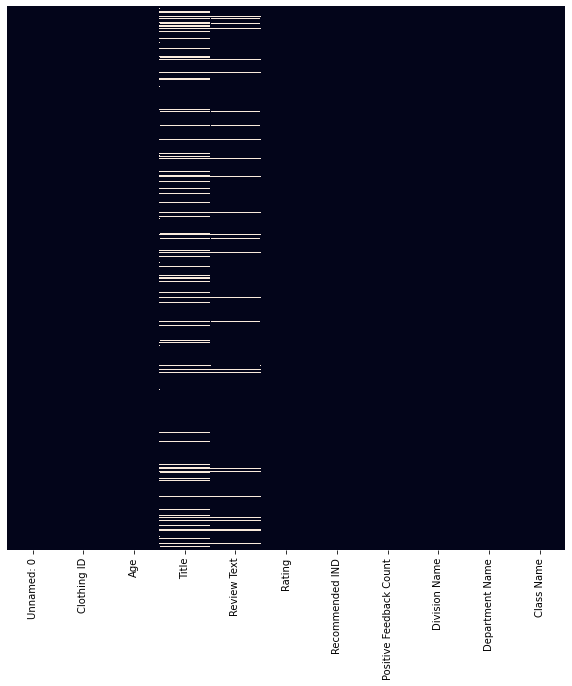

In [12]:
#Visualizing missing values through heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False)

In [13]:
#checking the percentage of missing values of each column
def missing_values_table(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
            " columns that have missing values.")
    return mis_val_table_ren_columns
missing_values_table(df)

Your selected dataframe has 11 columns.
There are 5 columns that have missing values.


,Missing Values,% of Total Values
Title,3810,16.2
Review Text,845,3.6
Division Name,14,0.1
Department Name,14,0.1
Class Name,14,0.1


In [14]:
df.drop(labels =['Clothing ID','Title','Unnamed: 0'],axis = 1,inplace = True) #Dropping unwanted columns

In [15]:
#dropping the rows with missing values

df = df.dropna()
df.isnull().sum()

Age                        0
Review Text                0
Rating                     0
Recommended IND            0
Positive Feedback Count    0
Division Name              0
Department Name            0
Class Name                 0
dtype: int64

Now there are no missing values present in our dataset

In [16]:
df.shape

(22628, 8)

In [17]:
df['Review_length'] = df['Review Text'].apply(len)
print(df.shape)
df.head()

(22628, 9)


,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Review_length
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,53
1,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,303
2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,500
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,124
4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,192


# Data visualization

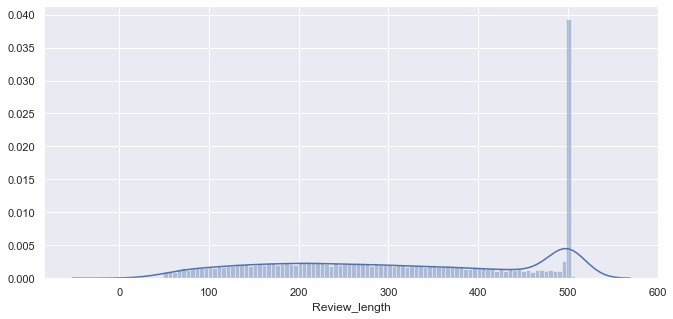

In [18]:
sns.set(rc={'figure.figsize':(11,5)})
sns.distplot(df['Review_length'] ,hist=True, bins=100)

In [19]:
df_zero = df[df['Recommended IND']==0]
df_one = df[df['Recommended IND']==1]

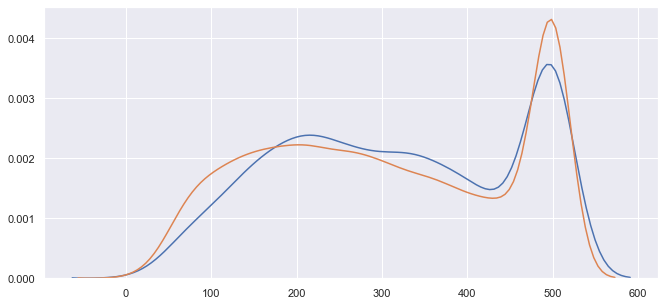

In [20]:
sns.distplot(df_zero[['Review_length']] ,hist=False)
sns.distplot(df_one[['Review_length']], hist=False)

In [21]:
import plotly.express as px

In [22]:
px.histogram(df, x = 'Age')

In [23]:
px.histogram(df, x = df['Rating'])

In [24]:
px.histogram(df, x = df['Class Name'])

In [25]:
px.scatter(df, x="Age", y="Positive Feedback Count", facet_row="Recommended IND", facet_col="Rating",trendline="ols",category_orders={"Rating": [1,2,3,4,5],'Recommended IND':[0,1]})

In [26]:
px.violin(df, x="Age", y="Department Name", orientation="h", color="Recommended IND")

In [27]:
px.box(df, x="Age", y="Division Name", orientation="h",color = 'Recommended IND')

# Cleaning the text data

In [28]:
err1 = df['Review Text'].str.extractall("(&amp)")
err2 = df['Review Text'].str.extractall("(\xa0)")

In [29]:
print('with &amp',len(err1[~err1.isna()]))
print('with (\xa0)',len(err2[~err2.isna()]))

with &amp 37
with ( ) 6


In [30]:
df['Review Text'] = df['Review Text'].str.replace('(&amp)','')
df['Review Text'] = df['Review Text'].str.replace('(\xa0)','')

In [31]:
err1 = df['Review Text'].str.extractall("(&amp)")
print('with &amp',len(err1[~err1.isna()]))
err2 = df['Review Text'].str.extractall("(\xa0)")
print('with (\xa0)',len(err2[~err2.isna()]))

with &amp 0
with ( ) 0


In [32]:
from textblob import *

In [33]:
df['polarity'] = df['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)

In [34]:
df['polarity']

0        0.633333
1        0.339583
2        0.073675
3        0.550000
4        0.512891
           ...   
23481    0.552667
23482    0.091667
23483    0.414286
23484    0.322222
23485    0.413889
Name: polarity, Length: 22628, dtype: float64

In [35]:
px.histogram(df, x = 'polarity')

In [36]:
px.box(df, y="polarity", x="Department Name", orientation="v",color = 'Recommended IND')

In [37]:
df['token_count'] = df['Review Text'].apply(lambda x: len(str(x).split()))

In [38]:
px.histogram(df, x = 'token_count')

# Reviews with Positive Polarity

In [39]:
sam = df.loc[df.polarity == 1,['Review Text']].sample(3).values

In [40]:
for i in sam:
    print(i[0])

So comfortable-so versatile-so perfect
Made my wedding outfit perfect!
This cover-up is perfect for the beach or the pool. it is see through.


# Reviews with Neutral Polarity

In [41]:
sam = df.loc[df.polarity == 0.5,['Review Text']].sample(3).values

In [42]:
for i in sam:
    print(i[0])

It is so cute in the picture but wasn't flattering on me. it also felt like i couldn't raise my arms while wearing it. i love retailer and will be a forever fan, but this dress just wasn't for me.
...and another addition to my wedding guest wardrobe! the skirt print is gorgeous and i can't wait to shop for the perfect shoe and accessories. i'm very hippy with a thinner waist and this hides that. i love the pockets and the fact that i can wear a regular, comfortable bra. all-around a great purchase!
I was returning some things when i saw these jeans and had to try them on! they must be magical pants, because they are slimming and very flattering! amazing jeans!


# Reviews with Negative Polarity

In [43]:
sam = df.loc[df.polarity < 0,['Review Text']].sample(3).values

In [44]:
for i in sam:
    print(i[0])

Due to the black sheath being out of stock in all sizes (for quite some time), i took my chances ordering an 8p in navy which was way too big on me. i also didnt love the navy. i wish i could try the 6 or 6p in black but out of stock and wouldn't arrive in time for my events. sadly returning.
This runs a bit on the large side. i ordered my usual m and had room to spare. the green color was lovely, but between the fit and the scratchy fabric, this is headed back. too bad!
Beautiful fabric with soft drape. unfortunately the "captain kangaroo" pockets are awful. unless you have a straight up and down shape with no hips this is very unflattering. the pockets look like saddle bags and add a huge amount of fabric where most people don't want added bulk. very disappointing. returned.


## Pie-chart about polarity

In [45]:
negative = (len(df.loc[df.polarity <0,['Review Text']].values)/len(df))*100
positive = (len(df.loc[df.polarity >0.5,['Review Text']].values)/len(df))*100
neutral  = len(df.loc[df.polarity >0 ,['Review Text']].values) - len(df.loc[df.polarity >0.5 ,['Review Text']].values)
neutral = neutral/len(df)*100

([<matplotlib.patches.Wedge at 0x230072654f0>,
 [Text(1.070361148411953, 0.25362770347547897, 'Positive'),
  Text(0.8759455369991821, 0.6653716376666611, 'Negative'),
  Text(-1.0057589117837669, -0.4454761625132516, 'Neutral')])

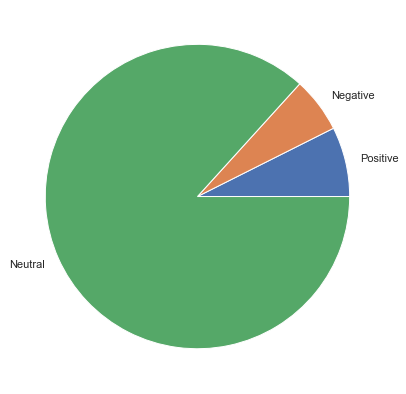

In [46]:
plt.figure(figsize =(10, 7)) 
plt.pie([positive,negative,neutral], labels = ['Positive','Negative','Neutral'])

In [47]:
from sklearn.feature_extraction.text import CountVectorizer

In [48]:
def top_n_ngram(corpus,n = None,ngram = 1):
    vec = CountVectorizer(stop_words = 'english',ngram_range=(ngram,ngram)).fit(corpus)
    bag_of_words = vec.transform(corpus) #Have the count of  all the words for each review
    sum_words = bag_of_words.sum(axis =0) #Calculates the count of all the word in the whole review
    words_freq = [(word,sum_words[0,idx]) for word,idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq,key = lambda x:x[1],reverse = True)
    return words_freq[:n]

## Visualizing Top 20 Unigrams

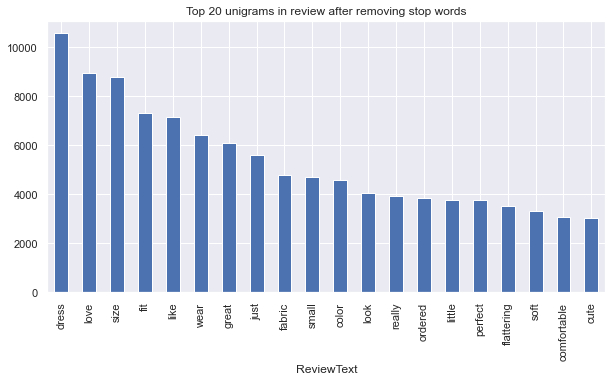

In [49]:
common_words = top_n_ngram(df['Review Text'], 20,1)
df1 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 unigrams in review after removing stop words')

## Visualizing Top 20 Bigrams

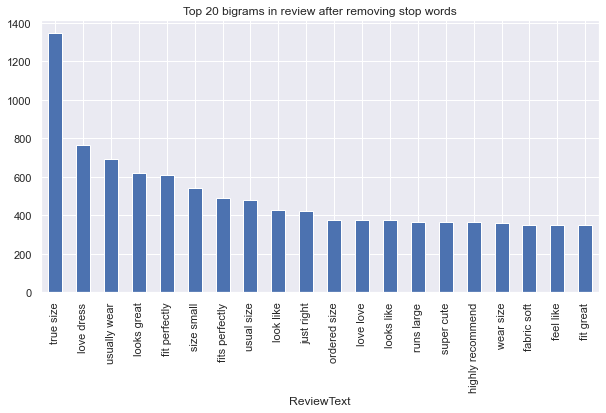

In [50]:
common_words = top_n_ngram(df['Review Text'], 20,2)
df1 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 bigrams in review after removing stop words')

## Visualizing Top 20 Trigrams

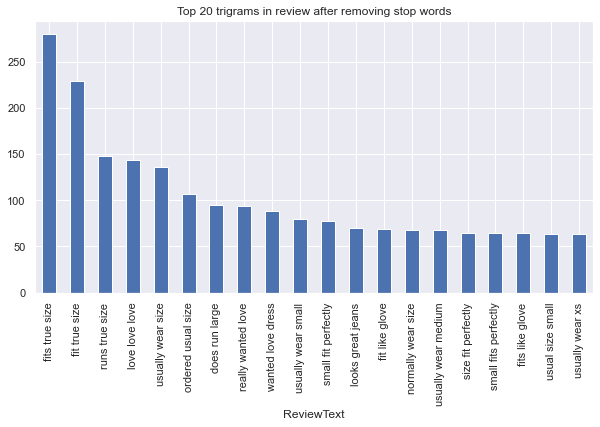

In [51]:
common_words = top_n_ngram(df['Review Text'], 20,3)
df1 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 trigrams in review after removing stop words')

## Visualizing Top 20 Part-of-Speech

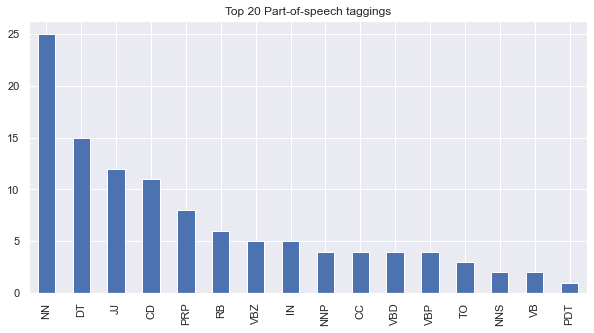

In [52]:
blob= TextBlob(str(df['Review Text']))
pos = pd.DataFrame(blob.tags,columns =['word','pos'])
pos1 = pos.pos.value_counts()[:20]
plt.figure(figsize = (10,5))
pos1.plot(kind='bar',title ='Top 20 Part-of-speech taggings')

In [53]:
y = df['Recommended IND']

In [54]:
X = df.drop(columns = 'Recommended IND')

## Correlation HeatMap

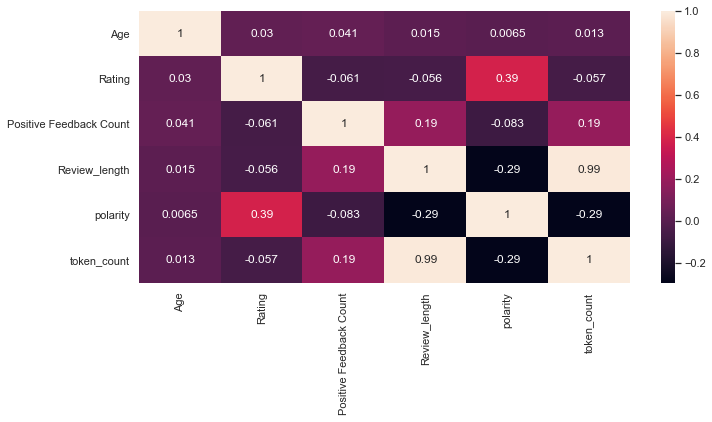

In [55]:
sns.heatmap(X.corr(),annot =True)

## Handling Multi-Colinearity

In [56]:
set1 =set()
cor = X.corr()
for i in cor.columns:
    for j in cor.columns:
        if cor[i][j]>0.8 and i!=j:
            set1.add(i)
print(set1)

{'Review_length', 'token_count'}


In [57]:
X = X.drop(labels = ['token_count'],axis = 1)

In [58]:
X.corr()

,Age,Rating,Positive Feedback Count,Review_length,polarity
Age,1.000000,0.030121,0.040807,0.014818,0.006531
Rating,0.030121,1.000000,-0.060845,-0.055851,0.386400
Positive Feedback Count,0.040807,-0.060845,1.000000,0.191053,-0.083396
Review_length,0.014818,-0.055851,0.191053,1.000000,-0.290758
polarity,0.006531,0.386400,-0.083396,-0.290758,1.000000


In [59]:
class1 =[]
for i in X.polarity:
    if float(i)>=0.0:
        class1.append(1)
    elif float(i)<0.0:
        class1.append(0)
X['sentiment'] = class1

## Statistical Description of Data

In [60]:
X.groupby(X['sentiment']).describe().T

sentiment                                 0             1
Age                     count  1.322000e+03  21306.000000
                        mean   4.308850e+01     43.294940
                        std    1.197634e+01     12.349849
                        min    2.000000e+01     18.000000
                        25%    3.425000e+01     34.000000
                        50%    4.100000e+01     41.000000
                        75%    5.100000e+01     52.000000
                        max    9.400000e+01     99.000000
Rating                  count  1.322000e+03  21306.000000
                        mean   2.919062e+00      4.261523
                        std    1.349107e+00      1.050894
                        min    1.000000e+00      1.000000
                        25%    2.000000e+00      4.000000
                        50%    3.000000e+00      5.000000
                        75%    4.000000e+00      5.000000
                        max    5.000000e+00      5.000000
Positive Feedback Count count  1.322000e+03  21306.000000
                        mean   3.177761e+00      2.597907
                        std    6.810800e+00      5.716465
                        min    0.000000e+00      0.000000
                        25%    0.000000e+00      0.000000
                        50%    1.000000e+00      1.000000
                        75%    3.000000e+00      3.000000
                        max    1.080000e+02    122.000000
Review_length           count  1.322000e+03  21306.000000
                        mean   2.956248e+02    309.576645
                        std    1.412196e+02    144.064665
                        min    1.100000e+01      9.000000
                        25%    1.782500e+02    187.000000
                        50%    2.825000e+02    303.000000
                        75%    4.247500e+02    461.000000
                        max    5.060000e+02    508.000000
polarity                count  1.322000e+03  21306.000000
                        mean  -9.423922e-02      0.271167
                        std    1.042942e-01      0.157119
                        min   -9.750000e-01      0.000000
                        25%   -1.250000e-01      0.158889
                        50%   -6.250000e-02      0.250000
                        75%   -2.658820e-02      0.358333
                        max   -1.734723e-18      1.000000
sentiment               count  1.322000e+03  21306.000000
                        mean   0.000000e+00      1.000000
                        std    0.000000e+00      0.000000
                        min    0.000000e+00      1.000000
                        25%    0.000000e+00      1.000000
                        50%    0.000000e+00      1.000000
                        75%    0.000000e+00      1.000000
                        max    0.000000e+00      1.000000

# Model Building

In [61]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

In [62]:
corpus = []

In [63]:
X.index = np.arange(len(X))

## RE + Tokenizing + Stemming + Corpus Creation

In [64]:
for i in range(len(X)):
    review = re.sub('[^a-zA-z]',' ',X['Review Text'][i])
    review = review.lower()
    review = review.split()
    ps = PorterStemmer()
    review =[ps.stem(i) for i in review if not i in set(stopwords.words('english'))]
    review =' '.join(review)
    corpus.append(review)

In [65]:
from sklearn.feature_extraction.text import TfidfVectorizer as TV
tv  = TV(ngram_range =(1,1),max_features = 3000)
X_tv = tv.fit_transform(corpus).toarray()
y = y.values

In [66]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X_tv,y,test_size=0.2,random_state=42)

## Handling imbalanced data

In [67]:
from imblearn.combine import SMOTEENN 
sm = SMOTEENN()
x_resampled,y_resampled=sm.fit_sample(X_tv,y)

In [68]:
xr_train,xr_test,yr_train,yr_test=train_test_split(x_resampled, y_resampled,test_size=0.2,random_state=42)

In [69]:
#Importing all the model library

from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB

#Importing Boosting models
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier

#Importing error metrics
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_curve,auc
from sklearn.model_selection import GridSearchCV,cross_val_score

In [70]:
KNN=KNeighborsClassifier(n_neighbors=6)
LR=LogisticRegression()
DT=DecisionTreeClassifier(random_state=6)
XGB=XGBClassifier()
RF=RandomForestClassifier()
ADA=AdaBoostClassifier()
BNB=BernoulliNB()
MNB=MultinomialNB()
GBC=GradientBoostingClassifier()
BC=BaggingClassifier()
ETC=ExtraTreesClassifier()

In [71]:
models= []
models.append(('KNeighborsClassifier', KNN))
models.append(('LogisticRegression', LR))
models.append(('DecisionTreeClassifier', DT))
models.append(('XGBClassifier', XGB))
models.append(('RandomForestClassifier', RF))
models.append(('AdaBoostClassifier', ADA))
models.append(('BernoulliNB', BNB))
models.append(('MultinomialNB', MNB))
models.append(('GradientBoostingClassifier', GBC))
models.append(('BaggingClassifier', BC))
models.append(('ExtraTreesClassifier', ETC))

****************************************** KNeighborsClassifier ********************************************************


KNeighborsClassifier(n_neighbors=6)


Accuracy_score =  0.9710439420878841


Cross_Val_Score =  0.9724606399187404


roc_auc_score =  0.7584745762711864


classification_report
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      3701
           1       1.00      0.52      0.68       236

    accuracy                           0.97      3937
   macro avg       0.99      0.76      0.83      3937
weighted avg       0.97      0.97      0.97      3937



[[3701    0]
 [ 114  122]]


AxesSubplot(0.125,0.808774;0.62x0.0712264)



****************************************** LogisticRegression ********************************************************


LogisticRegression()


Accuracy_score =  0.9883159766319533


Cross_Val_Score =  0.9866876628390457


roc_auc_score =  0.9045259183271583


classification_report
            

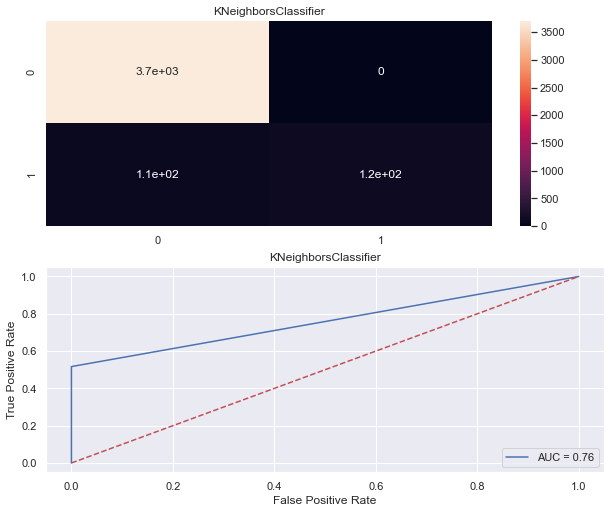

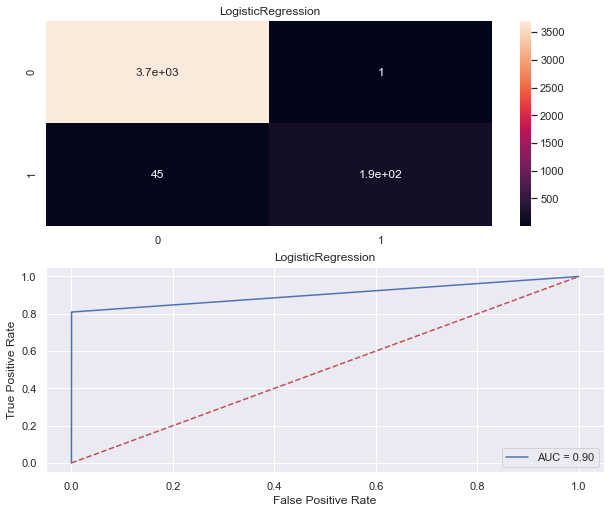

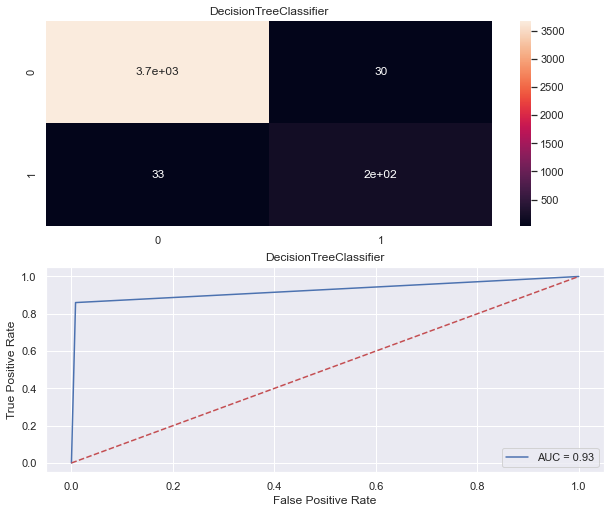

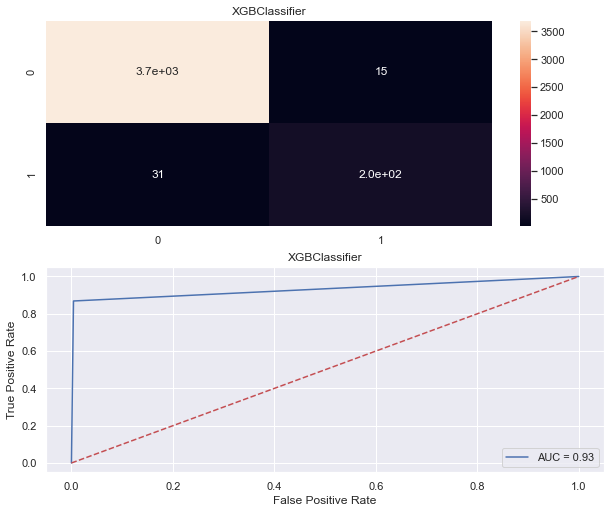

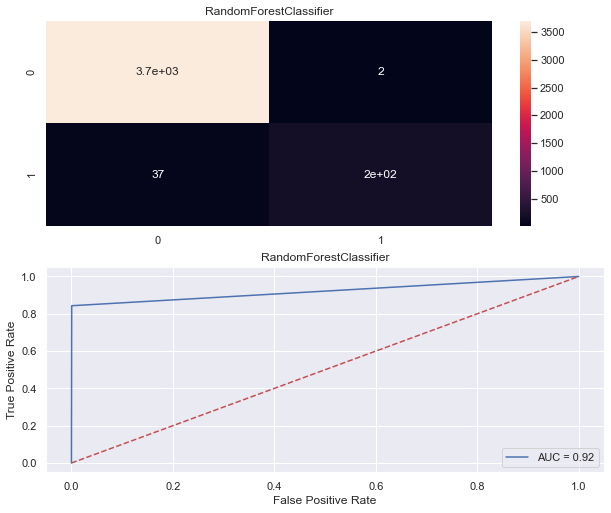

...

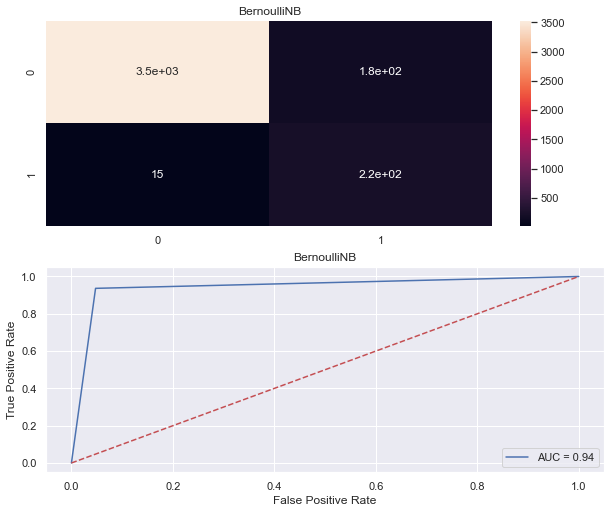

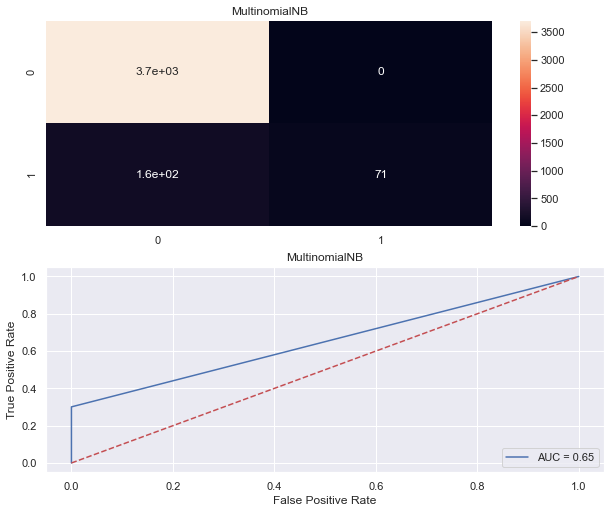

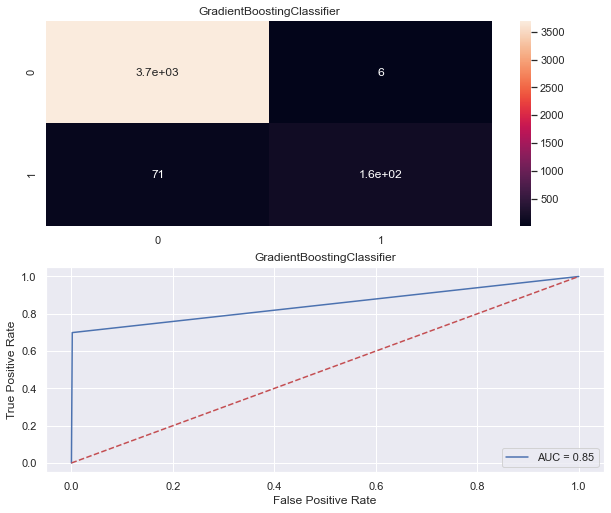

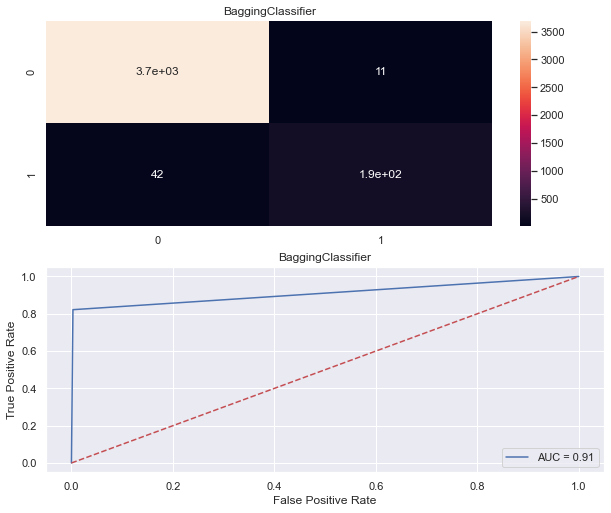

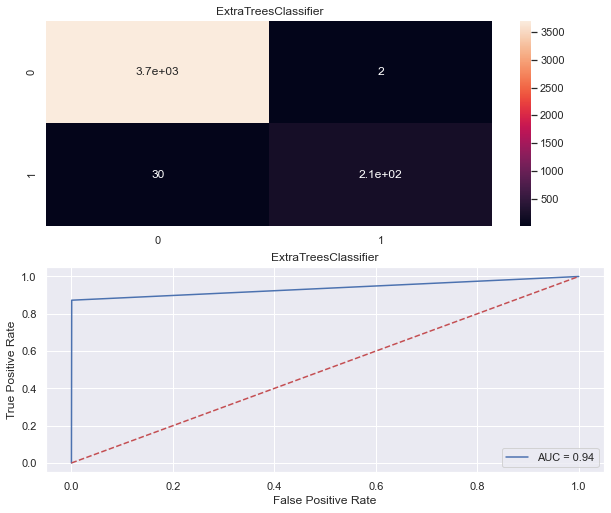

In [72]:
Model= []
score= []
cvs=[]
rocscore=[]
for name,model in models:
    print('******************************************',name,'********************************************************')
    print('\n')
    Model.append(name)
    model.fit(xr_train, yr_train)
    print(model)
    pre=model.predict(xr_test)
    print('\n')
    AS=accuracy_score(yr_test,pre)
    print('Accuracy_score = ',AS)
    score.append(AS*100)
    print('\n')
    sc= cross_val_score(model, x_resampled,y_resampled, cv=10, scoring='accuracy').mean()
    print('Cross_Val_Score = ',sc)
    cvs.append(sc*100)
    print('\n')
    false_positive_rate, true_positive_rate, thresholds = roc_curve(yr_test,pre)
    roc_auc= auc(false_positive_rate, true_positive_rate)
    print ('roc_auc_score = ',roc_auc)
    rocscore.append(roc_auc*100)
    print('\n')
    print('classification_report\n',classification_report(yr_test,pre))
    print('\n')
    cm=confusion_matrix(yr_test,pre)
    print(cm)
    print('\n')
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True))
    plt.subplot(912)
    plt.title(name)
    plt.plot(false_positive_rate, true_positive_rate, label='AUC = %0.2f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    print('\n\n')

In [73]:
result = pd.DataFrame({'Model': Model, 'Accuracy_score': score,'Cross_val_score': cvs,'Roc_auc_curve':rocscore})
result

,Model,Accuracy_score,Cross_val_score,Roc_auc_curve
0,KNeighborsClassifier,97.104394,97.246064,75.847458
1,LogisticRegression,98.831598,98.668766,90.452592
2,DecisionTreeClassifier,98.399797,98.374154,92.603179
3,XGBClassifier,98.831598,98.877123,93.229555
4,RandomForestClassifier,99.009398,98.922824,92.133997
5,AdaBoostClassifier,98.399797,98.145539,91.611406
6,BernoulliNB,95.148590,95.153244,94.444298
7,MultinomialNB,95.808992,95.848812,65.042373
8,GradientBoostingClassifier,98.044196,97.942192,84.876568
9,BaggingClassifier,98.653797,98.663731,90.953086


## Hyperparameter tuning

In [77]:
parameters={'n_estimators': [100, 250, 500], 'criterion': ['gini', 'entropy'], 'min_samples_split': [2, 4, 8], 'min_samples_leaf': [2, 4, 8] }
ETC=ExtraTreesClassifier()

clf=GridSearchCV(ETC, parameters, n_jobs=-1)
clf.fit(xr_train,yr_train)
print(clf.best_params_)

{'criterion': 'entropy', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}


In [80]:
#ExtraTreesClassifier with best parameters

ETC=ExtraTreesClassifier(criterion='entropy', n_estimators=50,random_state=9)
ETC.fit(xr_train,yr_train)
ETC.score(xr_test,yr_test)
predETC=ETC.predict(xr_test)
print(accuracy_score(yr_test,predETC))
print(confusion_matrix(yr_test,predETC))
print(classification_report(yr_test,predETC))

0.9898399796799594
[[3701    0]
 [  40  196]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3701
           1       1.00      0.83      0.91       236

    accuracy                           0.99      3937
   macro avg       0.99      0.92      0.95      3937
weighted avg       0.99      0.99      0.99      3937



In [81]:
#cross validate ETC

score=cross_val_score(ETC,x_resampled,y_resampled,cv=5,scoring='accuracy')

print(score)
print('Mean:',score.mean())
print('Std:',score.std())

[0.99110998 0.98831301 0.98780488 0.98755081 0.9898374 ]
Mean: 0.988923215956188
Std: 0.0013508663370905738


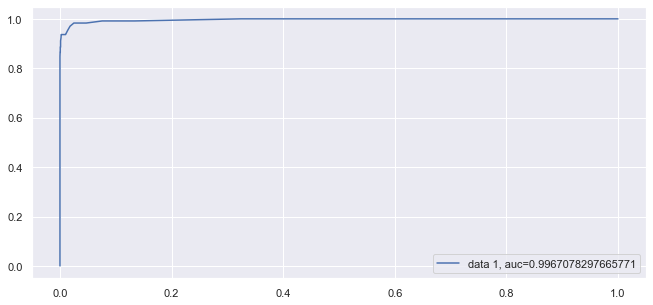

In [82]:
#plotting the roc auc curve

from sklearn import metrics
y_pred_proba = ETC.predict_proba(xr_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(yr_test,  y_pred_proba)
auc = metrics.roc_auc_score(yr_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Extra trees classifier is giving us best roc auc score so we save it as our final model

In [83]:
#saving our model

import joblib
joblib.dump(ETC,'ETC_Womens clothing reviews.csv')

['ETC_Womens clothing reviews.csv']

In [84]:
model=joblib.load('ETC_Womens clothing reviews.csv')

In [85]:
#Testing our model
import sys
nums= model.predict(x_test)
np.set_printoptions(threshold=sys.maxsize)
print(nums)

[0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 